# Instance Segmentation

In this tutorial, you will learn:
- the basic structure of Mask R-CNN.
- to perform inference with a MMDetection detector.
- to train a new instance segmentation model with a new dataset.

Let's start!

<a href="https://colab.research.google.com/drive/11MqMCyF_V7Rkw6b9CCShGfNTP59OJ905?usp=sharing"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"></a>

## Perform Inference with An MMDetection Detector

### A two-stage detector

In this tutorial, we use Mask R-CNN, a simple two-stage detector as an example.

The high-level architecture of Mask R-CNN is shown in the following picture. More details can be found in the [paper](https://arxiv.org/abs/1703.06870).

<img src="https://user-images.githubusercontent.com/40661020/143967081-c2552bed-9af2-46c4-ae44-5b3b74e5679f.png" alt="mask rcnn" align="bottom" />

Mask R-CNN adds a mask branch based on the original Faster R-CNN. It also uses RoIAlign, a more precise version of RoIPooling for RoI feature extraction to improve the performance.





In [1]:
!mim download mmdet --config mask-rcnn_r50-caffe_fpn_ms-poly-3x_coco --dest ./checkpoints

processing mask-rcnn_r50-caffe_fpn_ms-poly-3x_coco...
downloading --------------------------------------- 0.0/169.6 MiB ? eta -:--:--
downloading --------------------------------------- 0.0/169.6 MiB ? eta -:--:--
downloading -------------------------------- 0.1/169.6 MiB 1.7 MB/s eta 0:01:44
downloading -------------------------------- 0.2/169.6 MiB 1.8 MB/s eta 0:01:40
downloading -------------------------------- 0.3/169.6 MiB 2.2 MB/s eta 0:01:21
downloading -------------------------------- 0.4/169.6 MiB 1.8 MB/s eta 0:01:37
downloading -------------------------------- 0.5/169.6 MiB 2.4 MB/s eta 0:01:15
downloading -------------------------------- 0.6/169.6 MiB 2.1 MB/s eta 0:01:23
downloading -------------------------------- 0.7/169.6 MiB 2.2 MB/s eta 0:01:21
downloading -------------------------------- 0.7/169.6 MiB 2.2 MB/s eta 0:01:21
downloading -------------------------------- 0.7/169.6 MiB 1.8 MB/s eta 0:01:41
downloading -------------------------------- 1.1/169.6 MiB 2.6 MB/

In [3]:
import mmcv
import mmengine
from mmdet.apis import init_detector, inference_detector
from mmdet.utils import register_all_modules
# Choose to use a config and initialize the detector
config_file = 'checkpoints/mask-rcnn_r50-caffe_fpn_ms-poly-3x_coco.py'
# Setup a checkpoint file to load
checkpoint_file = 'checkpoints/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth'

# register all modules in mmdet into the registries
register_all_modules()

# build the model from a config file and a checkpoint file
model = init_detector(config_file, checkpoint_file, device='cuda:0')  # or device='cuda:0'


Loads checkpoint by local backend from path: checkpoints/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth


From the printed model, we will find that the model does consist of the components that we described earlier. It uses ResNet as its CNN backbone, and has a RPN head and RoI Head.
The RoI Head includes box head and mask head. In addition, the model has a neural network module, named neck, directly after the CNN backbone. It is a [feature pyramid network (FPN)](https://arxiv.org/abs/1612.03144) for enhancing the multi-scale features.


### Inference with the detector

The model is successfully created and loaded, let's see how good it is. We use the high-level API `inference_detector` implemented in the MMDetection. This API is created to ease the inference process. The details of the codes can be found [here](https://github.com/open-mmlab/mmdetection/blob/master/mmdet/apis/inference.py#L15).

In [5]:
# Use the detector to do inference
image = mmcv.imread('demo/demo.jpg',channel_order='rgb')
result = inference_detector(model, image)
print(result)

<DetDataSample(

    META INFORMATION
    img_path: None
    batch_input_shape: (800, 1216)
    ori_shape: (427, 640)
    img_shape: (800, 1199)
    scale_factor: (1.8734375, 1.873536299765808)
    pad_shape: (800, 1216)
    img_id: 0

    DATA FIELDS
    ignored_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            bboxes: tensor([], device='cuda:0', size=(0, 4))
            masks: BitmapMasks(num_masks=0, height=427, width=640)
            labels: tensor([], device='cuda:0', dtype=torch.int64)
        ) at 0x21e7f83f820>
    pred_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            bboxes: tensor([[219.8669, 177.0806, 458.3723, 382.1342],
                        [480.5561, 110.4772, 523.1896, 130.3328],
                        [167.2968, 108.4708, 219.3689, 139.7077],
                        [432.7687, 104.8356, 482.8206, 132.2970],
                        [293.9347, 116.153

### Let's plot the result

In [10]:
from mmdet.registry import VISUALIZERS
# init visualizer(run the block only once in jupyter notebook)
visualizer = VISUALIZERS.build(model.cfg.visualizer)
# the dataset_meta is loaded from the checkpoint and
# then pass to the model in init_detector
visualizer.dataset_meta = model.dataset_meta

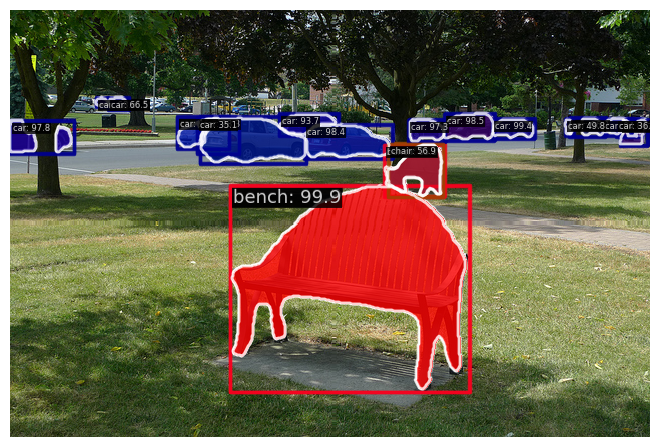

In [11]:
# show the results
visualizer.add_datasample(
    'result',
    image,
    data_sample=result,
    draw_gt = None,
    wait_time=0,
)
visualizer.show()

## Train a Detector on A Customized Dataset

To train a new detector, there are usually three things to do:
1. Support a new dataset
2. Modify the config
3. Train a new detector



### Support a new dataset

There are three ways to support a new dataset in MMDetection:
  1. Reorganize the dataset into a COCO format
  2. Reorganize the dataset into a middle format
  3. Implement a new dataset

We recommend the first two methods, as they are usually easier than the third.

In this tutorial, we give an example that converts the data into COCO format because MMDetection **only support evaluating mask AP of dataset in COCO format for now**. Other methods and more advanced usages can be found in the [doc](https://mmdetection.readthedocs.io/en/latest/advanced_guides/customize_dataset.html).

First, let's download the [the balloon dataset](https://github.com/matterport/Mask_RCNN/tree/master/samples/balloon).

**Bilgilendirme:** Balloon veri seti halihazırda mevcuttur ve `data/balloon` klasörü altında bulunmaktadır.
Bu nedenle aşağıdaki indirme ve zipten çıkarma işlemlerini tekrar yapmanıza gerek yoktur.

In [ ]:
# download and unzip the data
# !wget -c https://github.com/matterport/Mask_RCNN/releases/download/v2.1/balloon_dataset.zip

In [ ]:
# !unzip balloon_dataset.zip -d ./ballondatasets/

# Check the directory structure of the tiny data

# Install tree first in your terminal(linux)
sudo apt-get -q install tree


In [13]:
!tree data/balloon

Folder PATH listing
Volume serial number is 0000003D EF42:C540
C:\USERS\ERAYE\DESKTOP\ERAY\EE563\04_OPENMMLAB\MMDETECTION\DATA\BALLOON
����train
����val


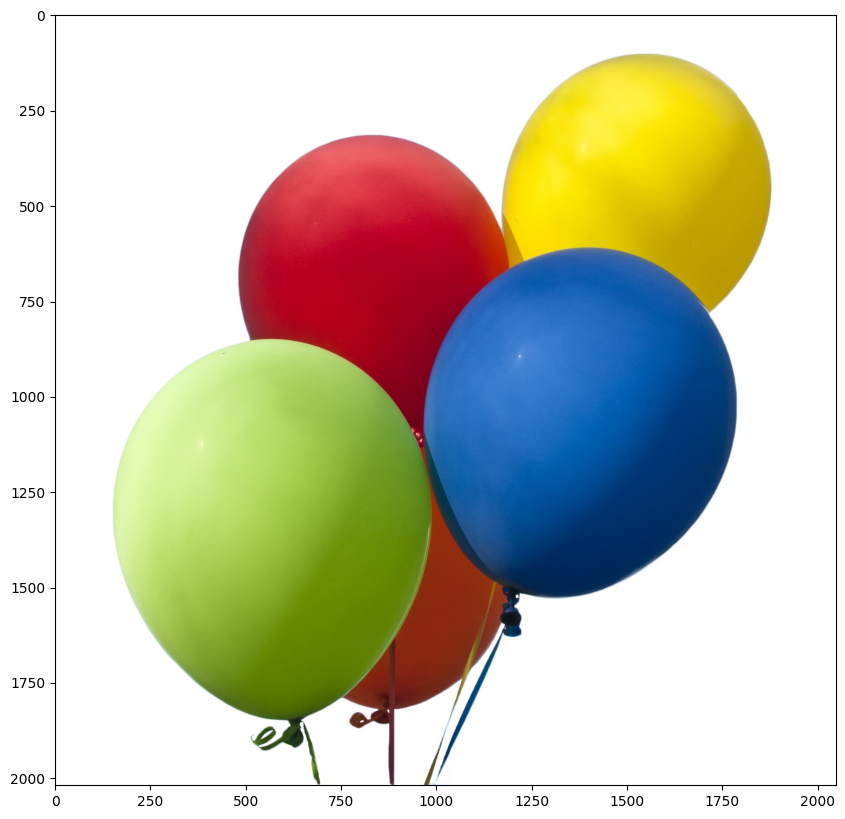

In [14]:
# Let's take a look at the dataset image
import mmcv
import matplotlib.pyplot as plt

img = mmcv.imread('data/balloon/train/10464445726_6f1e3bbe6a_k.jpg')
plt.figure(figsize=(15, 10))
plt.imshow(mmcv.bgr2rgb(img))
plt.show()

After downloading the data, we need to implement a function to convert the annotation format into the COCO format. Then we can use implemented `COCODataset` to load the data and perform training and evaluation.
Let's take a look at the annotation json file.



In [15]:
# Check the label of a single image
import mmengine

annotation = mmengine.load('./data/balloon/train/via_region_data.json')

In [16]:
# The annotation is a dict, and its values looks like the following
annotation['34020010494_e5cb88e1c4_k.jpg1115004']

{'fileref': '',
 'size': 1115004,
 'filename': '34020010494_e5cb88e1c4_k.jpg',
 'base64_img_data': '',
 'file_attributes': {},
 'regions': {'0': {'shape_attributes': {'name': 'polygon',
    'all_points_x': [1020,
     1000,
     994,
     1003,
     1023,
     1050,
     1089,
     1134,
     1190,
     1265,
     1321,
     1361,
     1403,
     1428,
     1442,
     1445,
     1441,
     1427,
     1400,
     1361,
     1316,
     1269,
     1228,
     1198,
     1207,
     1210,
     1190,
     1177,
     1172,
     1174,
     1170,
     1153,
     1127,
     1104,
     1061,
     1032,
     1020],
    'all_points_y': [963,
     899,
     841,
     787,
     738,
     700,
     663,
     638,
     621,
     619,
     643,
     672,
     720,
     765,
     800,
     860,
     896,
     942,
     990,
     1035,
     1079,
     1112,
     1129,
     1134,
     1144,
     1153,
     1166,
     1166,
     1150,
     1136,
     1129,
     1122,
     1112,
     1084,
     1037,
     989,

According to the above observation, each single image has a corresponding annotation containing keys `filename` and `regions` that are necessary for training.
We need to read annotations of each image and convert them into COCO format as below:

```python
{
    "images": [image],
    "annotations": [annotation],
    "categories": [category]
}


image = {
    "id": int,
    "width": int,
    "height": int,
    "file_name": str,
}

annotation = {
    "id": int,
    "image_id": int,
    "category_id": int,
    "segmentation": RLE or [polygon],
    "area": float,
    "bbox": [x,y,width,height],
    "iscrowd": 0 or 1,
}

categories = [{
    "id": int,
    "name": str,
    "supercategory": str,
}]
```
**Note**: We only list the necessary keys for training, as shown above. For a full COCO format, please see [here](https://cocodataset.org/#format-data).

In [17]:
import os.path as osp

def convert_balloon_to_coco(ann_file, out_file, image_prefix):
    data_infos = mmengine.load(ann_file)

    annotations = []
    images = []
    obj_count = 0
    for idx, v in enumerate(mmengine.track_iter_progress(list(data_infos.values()))):
        filename = v['filename']
        img_path = osp.join(image_prefix, filename)
        height, width = mmcv.imread(img_path).shape[:2]

        images.append(dict(
            id=idx,
            file_name=filename,
            height=height,
            width=width))

        bboxes = []
        labels = []
        masks = []
        for _, obj in v['regions'].items():
            assert not obj['region_attributes']
            obj = obj['shape_attributes']
            px = obj['all_points_x']
            py = obj['all_points_y']
            poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
            poly = [p for x in poly for p in x]

            x_min, y_min, x_max, y_max = (
                min(px), min(py), max(px), max(py))


            data_anno = dict(
                image_id=idx,
                id=obj_count,
                category_id=0,
                bbox=[x_min, y_min, x_max - x_min, y_max - y_min],
                area=(x_max - x_min) * (y_max - y_min),
                segmentation=[poly],
                iscrowd=0)
            annotations.append(data_anno)
            obj_count += 1

    coco_format_json = dict(
        images=images,
        annotations=annotations,
        categories=[{'id':0, 'name': 'balloon'}])
    mmengine.dump(coco_format_json, out_file)

In [18]:
convert_balloon_to_coco(
    './data/balloon/train/via_region_data.json',
    './data/balloon/train/annotation_coco.json',
    './data/balloon/train/')
convert_balloon_to_coco(
    './data/balloon/val/via_region_data.json',
    './data/balloon/val/annotation_coco.json',
    './data/balloon/val/')

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 61/61, 84.7 task/s, elapsed: 1s, ETA:     0s
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 13/13, 77.6 task/s, elapsed: 0s, ETA:     0s


Checking the label corresponding to the instance split ID after the data format conversion is complete

In [19]:
from pycocotools.coco import COCO

# Path to load the COCO annotation file
annotation_file = './data/balloon/train/annotation_coco.json'

# Initialise the COCO object
coco = COCO(annotation_file)

# Get all category tags and corresponding category IDs
categories = coco.loadCats(coco.getCatIds())
category_id_to_name = {cat['id']: cat['name'] for cat in categories}

# Print all category IDs and corresponding category names
for category_id, category_name in category_id_to_name.items():
    print(f"Category ID: {category_id}, Category Name: {category_name}")

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
Category ID: 0, Category Name: balloon


### Modify the config

In the next step, we need to modify the config for the training.
To accelerate the process, we finetune a detector using a pre-trained detector.

In [23]:
from mmengine import Config
cfg = Config.fromfile('./checkpoints/mask-rcnn_r50-caffe_fpn_ms-poly-3x_coco.py')

Given a config that trains a Mask R-CNN on COCO dataset, we need to modify some values to use it for training on the balloon dataset.

In [24]:
from mmengine.runner import set_random_seed

# Modify dataset classes and color
cfg.metainfo = {
    'classes': ('balloon', ),
    'palette': [
        (220, 20, 60),
    ]
}

# Modify dataset type and path
cfg.data_root = './data/balloon'

cfg.train_dataloader.dataset.ann_file = 'train/annotation_coco.json'
cfg.train_dataloader.dataset.data_root = cfg.data_root
cfg.train_dataloader.dataset.data_prefix.img = 'train/'
cfg.train_dataloader.dataset.metainfo = cfg.metainfo

cfg.val_dataloader.dataset.ann_file = 'val/annotation_coco.json'
cfg.val_dataloader.dataset.data_root = cfg.data_root
cfg.val_dataloader.dataset.data_prefix.img = 'val/'
cfg.val_dataloader.dataset.metainfo = cfg.metainfo

cfg.test_dataloader = cfg.val_dataloader

# Modify metric config
cfg.val_evaluator.ann_file = cfg.data_root+'/'+'val/annotation_coco.json'
cfg.test_evaluator = cfg.val_evaluator

# Modify num classes of the model in box head and mask head
cfg.model.roi_head.bbox_head.num_classes = 1
cfg.model.roi_head.mask_head.num_classes = 1

# We can still the pre-trained Mask RCNN model to obtain a higher performance
cfg.load_from = 'checkpoints/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth'

# Set up working dir to save files and logs.
cfg.work_dir = './tutorial_exps'


# We can set the evaluation interval to reduce the evaluation times
cfg.train_cfg.val_interval = 3
# We can set the checkpoint saving interval to reduce the storage cost
cfg.default_hooks.checkpoint.interval = 3

# The original learning rate (LR) is set for 8-GPU training.
# We divide it by 8 since we only use one GPU.
cfg.optim_wrapper.optimizer.lr = 0.02 / 8
cfg.default_hooks.logger.interval = 10


# Set seed thus the results are more reproducible
# cfg.seed = 0
set_random_seed(0, deterministic=False)

# We can also use tensorboard to log the training process
cfg.visualizer.vis_backends.append({"type":'TensorboardVisBackend'})

#------------------------------------------------------
config=f'./checkpoints/mask-rcnn_r50-caffe_fpn_ms-poly-3x_balloon.py'
with open(config, 'w') as f:
    f.write(cfg.pretty_text)

### Train a new detector

Finally, lets initialize the dataset and detector, then train a new detector!

In [25]:
!python tools/train.py {config}

python: can't open file 'tools/train.py': [Errno 2] No such file or directory


In [26]:
from mmengine.runner import Runner

runner = Runner.from_cfg(cfg)
runner.train()

02/13 00:01:53 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: win32
    Python: 3.8.20 (default, Oct  3 2024, 15:19:54) [MSC v.1929 64 bit (AMD64)]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 209652396
    GPU 0: NVIDIA GeForce RTX 3050 Ti Laptop GPU
    CUDA_HOME: None
    GCC: n/a
    PyTorch: 2.1.2+cu121
    PyTorch compiling details: PyTorch built with:
  - C++ Version: 199711
  - MSVC 192930151
  - Intel(R) Math Kernel Library Version 2020.0.2 Product Build 20200624 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v3.1.1 (Git Hash 64f6bcbcbab628e96f33a62c3e975f8535a7bde4)
  - OpenMP 2019
  - LAPACK is enabled (usually provided by MKL)
  - CPU capability usage: AVX512
  - CUDA Runtime 12.1
  - NVCC architecture flags: -gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_61,code=sm_61;-gencode;arch=compute_70,code=sm_70;-gencod

c:\Users\eraye\miniconda3\envs\openmmlab\lib\site-packages\mmengine\utils\manager.py:113: UserWarning: <class 'mmdet.visualization.local_visualizer.DetLocalVisualizer'> instance named of visualizer has been created, the method `get_instance` should not accept any other arguments
  warnings.warn(


02/13 00:01:54 - mmengine - INFO - Distributed training is not used, all SyncBatchNorm (SyncBN) layers in the model will be automatically reverted to BatchNormXd layers if they are used.
02/13 00:01:54 - mmengine - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) RuntimeInfoHook                    
(BELOW_NORMAL) LoggerHook                         
 -------------------- 
before_train:
(VERY_HIGH   ) RuntimeInfoHook                    
(NORMAL      ) IterTimerHook                      
(VERY_LOW    ) CheckpointHook                     
 -------------------- 
before_train_epoch:
(VERY_HIGH   ) RuntimeInfoHook                    
(NORMAL      ) IterTimerHook                      
(NORMAL      ) DistSamplerSeedHook                
 -------------------- 
before_train_iter:
(VERY_HIGH   ) RuntimeInfoHook                    
(NORMAL      ) IterTimerHook                      
 -------------------- 
after_train_iter:
(VERY_HIGH   ) RuntimeInfoHook                

Downloading: "https://download.openmmlab.com/pretrain/third_party/resnet50_msra-5891d200.pth" to C:\Users\eraye/.cache\torch\hub\checkpoints\resnet50_msra-5891d200.pth


02/13 00:02:55 - mmengine - WARNING - The model and loaded state dict do not match exactly

unexpected key in source state_dict: conv1.bias

Loads checkpoint by local backend from path: checkpoints/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth
The model and loaded state dict do not match exactly

size mismatch for roi_head.bbox_head.fc_cls.weight: copying a param with shape torch.Size([81, 1024]) from checkpoint, the shape in current model is torch.Size([2, 1024]).
size mismatch for roi_head.bbox_head.fc_cls.bias: copying a param with shape torch.Size([81]) from checkpoint, the shape in current model is torch.Size([2]).
size mismatch for roi_head.bbox_head.fc_reg.weight: copying a param with shape torch.Size([320, 1024]) from checkpoint, the shape in current model is torch.Size([4, 1024]).
size mismatch for roi_head.bbox_head.fc_reg.bias: copying a param with shape torch.Size([320]) from checkpoint, the shape in current model is

MaskRCNN(
  (data_preprocessor): DetDataPreprocessor()
  (backbone): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): ResLayer(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)

### Understand the log
From the log, we can have a basic understanding on the training process and know how well the detector is trained.

First, since the dataset we are using is small, we loaded a Mask R-CNN model and finetune it for detection. Because the original Mask R-CNN is trained on COCO dataset that contains 80 classes but KITTI Tiny dataset only have 3 classes. Therefore, the last FC layers of the pre-trained Mask R-CNN for classification and regression have different weight shape and are not used. The pre-trained weights of mask prediction layer `mask_head.conv_logits` also does not matches the current model and is not used due to similar reason.

Third, after training, the detector is evaluated by the default COCO-style evaluation. The results show that the detector achieves 79.6 bbox AP and 81.5 mask AP on the val dataset, not bad!

 We can also check the tensorboard to see the curves.

In [27]:
%pip install tensorboard  -i https://mirrors.ustc.edu.cn/pypi/web/simple

Looking in indexes: https://mirrors.ustc.edu.cn/pypi/web/simple
     ---------------------------------------- 0.0/5.5 MB ? eta -:--:--
     ---------------------------------------- 0.0/5.5 MB ? eta -:--:--
     ---------------------------------------- 0.0/5.5 MB ? eta -:--:--
     ---------------------------------------- 0.0/5.5 MB ? eta -:--:--
     ---------------------------------------- 0.0/5.5 MB ? eta -:--:--
     - -------------------------------------- 0.3/5.5 MB ? eta -:--:--
     - -------------------------------------- 0.3/5.5 MB ? eta -:--:--
     - -------------------------------------- 0.3/5.5 MB ? eta -:--:--
     --- ------------------------------------ 0.5/5.5 MB 479.2 kB/s eta 0:00:11
     ----- ---------------------------------- 0.8/5.5 MB 621.2 kB/s eta 0:00:08
     ------- -------------------------------- 1.0/5.5 MB 774.0 kB/s eta 0:00:06
     ----------- ---------------------------- 1.6/5.5 MB 1.0 MB/s eta 0:00:04
     ----------------- ---------------------- 2.4/

In [28]:
# load tensorboard in jupyter notebook
%load_ext tensorboard

"Eğitim sırasında Tensorboard hook'u varsayılan olarak etkinleştirilmediği için vis_data (log dosyaları) üretilmemiştir; ancak 
.pth formatındaki modeller başarıyla kaydedilmiştir ve doğrudan test işlemine geçilebilir."

In [33]:
# see curves in tensorboard
# if you see <IPython.core.display.HTML object> please run it again
%tensorboard --logdir tutorial_exps/20260213_000152

Reusing TensorBoard on port 6006 (pid 45020), started 0:00:03 ago. (Use '!kill 45020' to kill it.)

## Test the Trained Detector

After finetuning the detector, let's visualize the prediction results!

normalde epoch_12.pth idi, epoch_36.pth olarak güncelledik.

In [35]:
import mmcv
from mmdet.apis import init_detector, inference_detector
img = mmcv.imread('./data/balloon/train/7178882742_f090f3ce56_k.jpg',channel_order='rgb')
checkpoint_file = 'tutorial_exps/epoch_36.pth'
model = init_detector(cfg, checkpoint_file, device='cpu')
new_result = inference_detector(model, img)
print(new_result)

Loads checkpoint by local backend from path: tutorial_exps/epoch_36.pth
<DetDataSample(

    META INFORMATION
    img_path: None
    batch_input_shape: (800, 1216)
    ori_shape: (1360, 2048)
    img_shape: (800, 1205)
    scale_factor: (0.58837890625, 0.5882352941176471)
    pad_shape: (800, 1216)
    img_id: 0

    DATA FIELDS
    ignored_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            bboxes: tensor([], size=(0, 4))
            masks: BitmapMasks(num_masks=0, height=1360, width=2048)
            labels: tensor([], dtype=torch.int64)
        ) at 0x21ebf27b7f0>
    pred_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            bboxes: tensor([[ 665.1602,  246.6673, 1396.0323,  985.2085],
                        [ 583.5402,  411.4014,  734.2264,  827.0711],
                        [1295.0936,  418.6701, 1687.2922,  924.3712],
                        [ 492.7147,  405.8000,  6

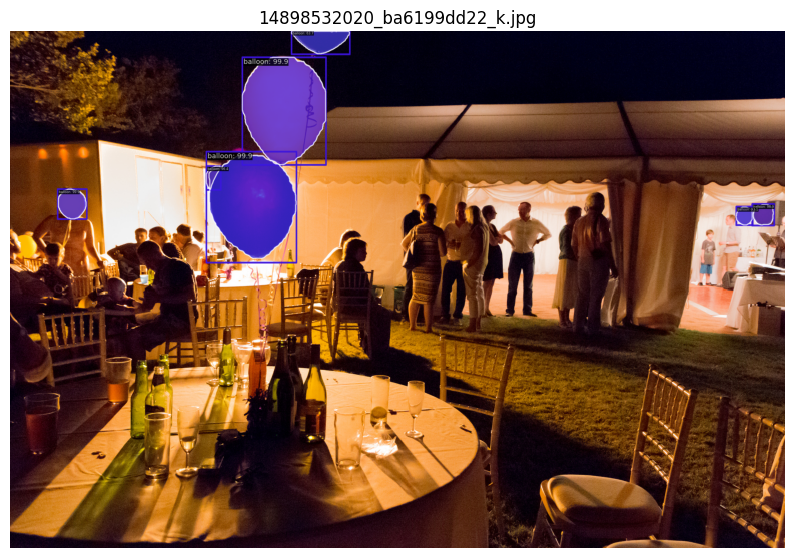

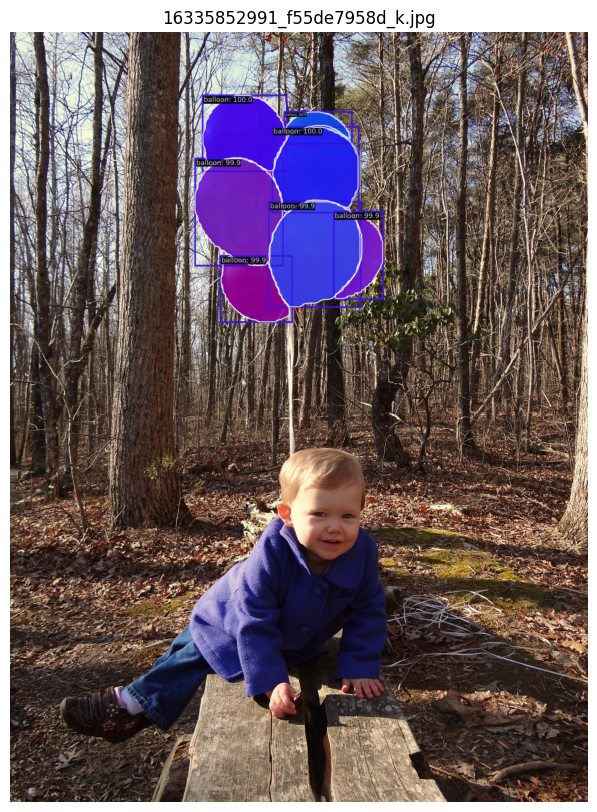

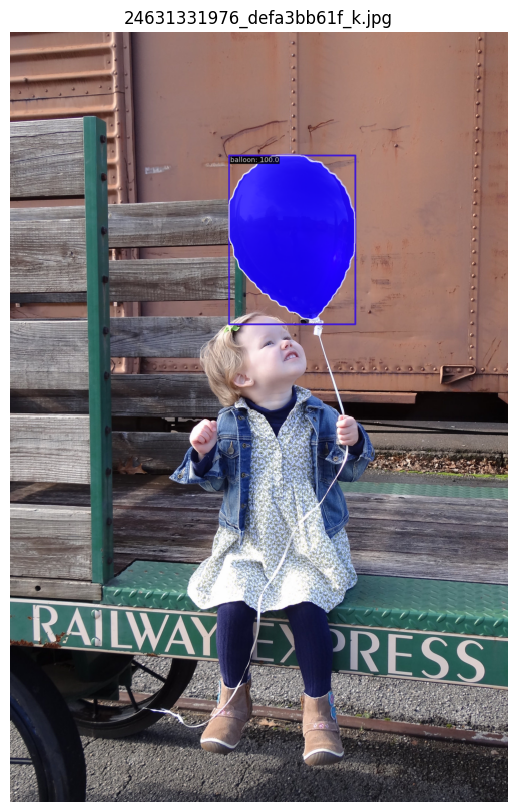

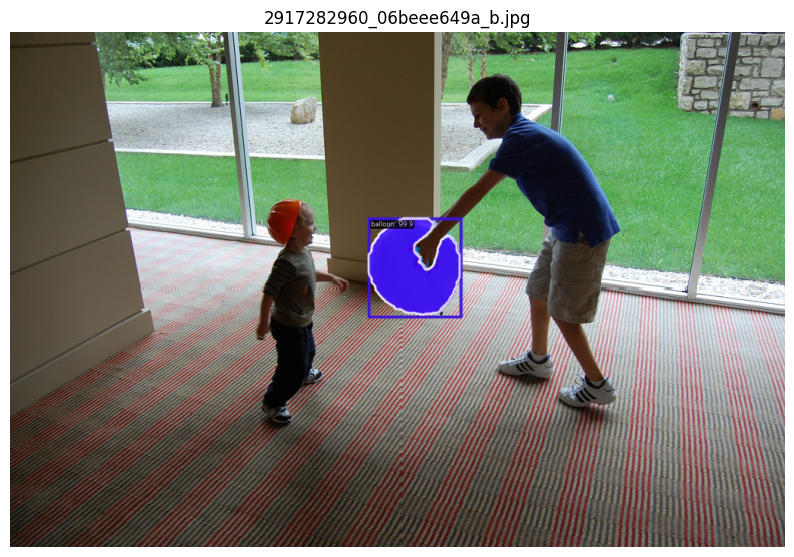

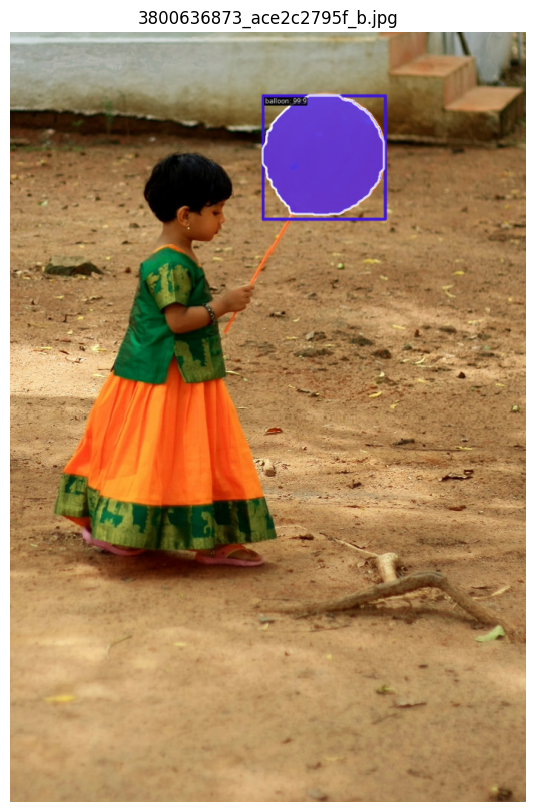

...

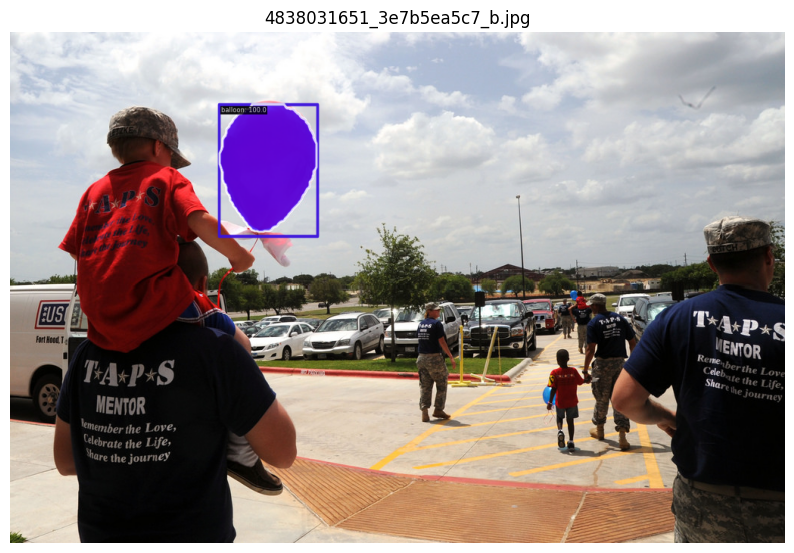

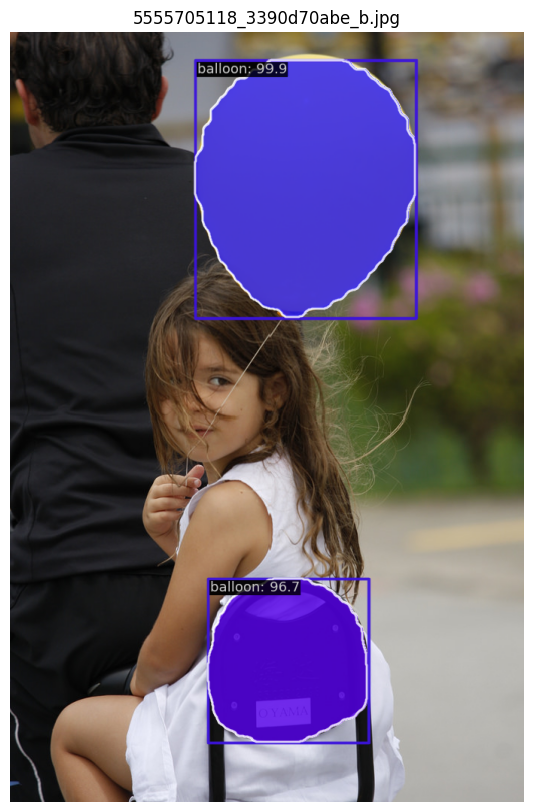

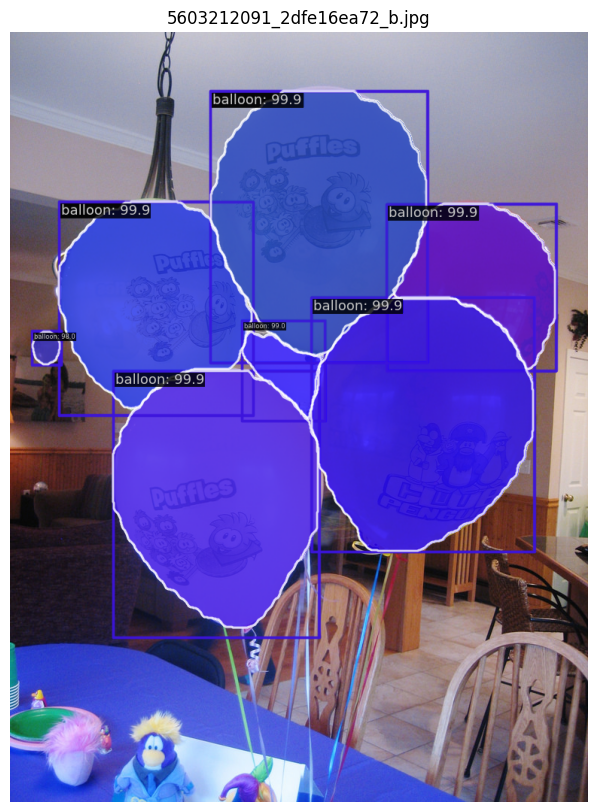

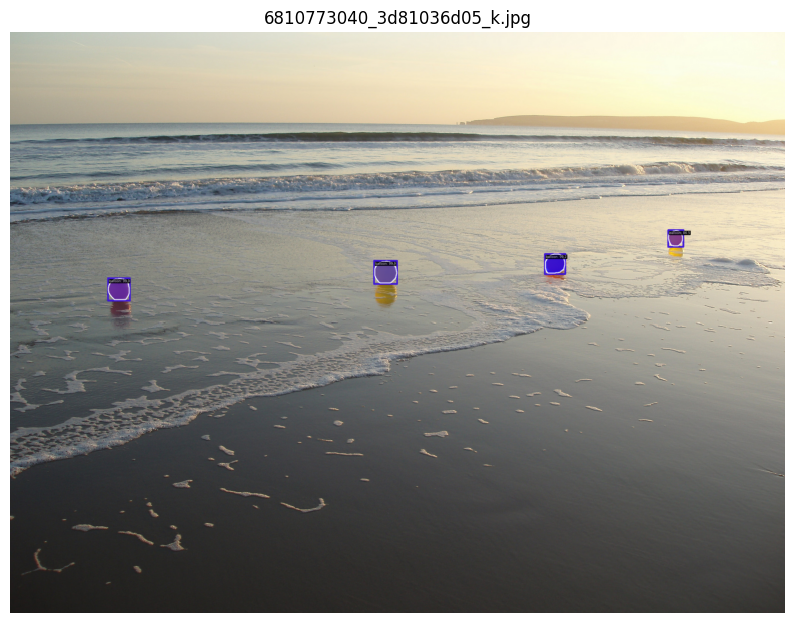

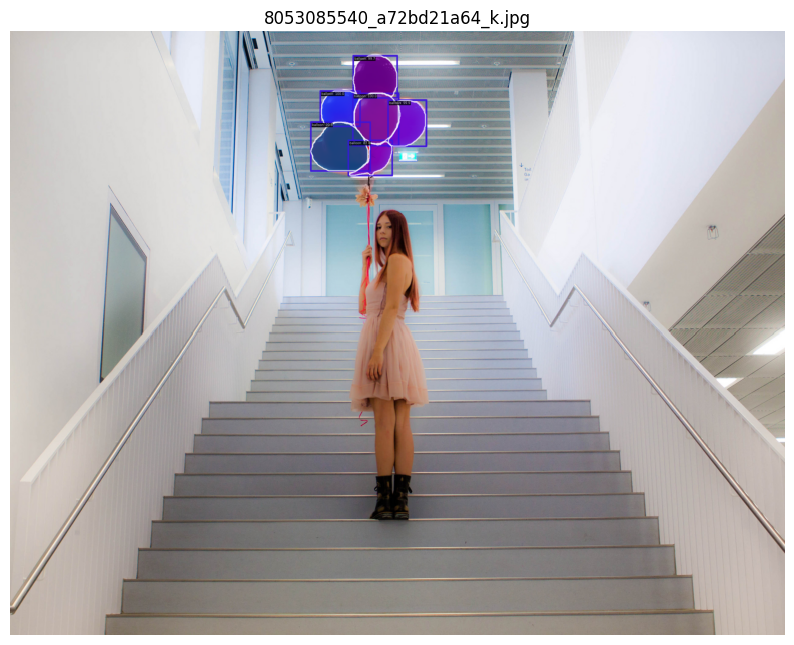

In [39]:
import os
import mmcv
import matplotlib.pyplot as plt
from mmdet.apis import inference_detector
from mmengine.visualization import Visualizer

val_path = 'data/balloon/val'
img_files = [os.path.join(val_path, f) for f in os.listdir(val_path) if f.endswith('.jpg')]

# Visualizer'ı al
visualizer_now = Visualizer.get_current_instance()
visualizer_now.dataset_meta = model.dataset_meta

for img_path in img_files:
    img = mmcv.imread(img_path)
    result = inference_detector(model, img)
    
    # Görseli hazırla
    visualizer_now.add_datasample(
        'result',
        img,
        data_sample=result,
        draw_gt=False,
        pred_score_thr=0.5,
        show=False  # Jupyter içinde otomatik show yapma, veriyi sakla
    )
    
    # Çizilmiş resmi al (numpy array formatında)
    drawn_img = visualizer_now.get_image()
    
    # Matplotlib ile göster
    plt.figure(figsize=(10, 10))
    plt.imshow(mmcv.bgr2rgb(drawn_img)) # OpenCV BGR okur, Matplotlib RGB ister
    plt.title(os.path.basename(img_path))
    plt.axis('off')
    plt.show() # Her iterasyonda çizdir

## What to Do Next?

So far, we have learnt how to test and train Mask R-CNN. To further explore the segmentation task, you could do several other things as shown below:

- Try cascade methods, e.g., [Cascade Mask R-CNN](https://github.com/open-mmlab/mmdetection/tree/master/configs/cascade_rcnn) and [HTC](https://github.com/open-mmlab/mmdetection/tree/master/configs/htc) in [MMDetection model zoo](https://github.com/open-mmlab/mmdetection/blob/master/docs/en/model_zoo.md). They are powerful detectors that are ranked high in many benchmarks, e.g., COCO dataset.
- Try single-stage methods, e.g., [K-Net](https://github.com/ZwwWayne/K-Net) and [Dense-RepPoints](https://github.com/justimyhxu/Dense-RepPoints). These two algorithms are based on MMDetection. Box-free instance segmentation is a new trend in the instance segmentation community.
- Try semantic segmentation. Semantic segmentation is also a popular task with wide applications. You can explore [MMSegmentation](https://github.com/open-mmlab/mmsegmentation/); we also provide a [colab tutorial](https://github.com/open-mmlab/mmsegmentation/blob/master/demo/MMSegmentation_Tutorial.ipynb) for semantic segmentation using MMSegmentation.
